In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from PIL import Image
import xarray as xr
from herbie import Herbie, paint, FastHerbie
from matplotlib.ticker import MaxNLocator
from IPython.display import display, Image as IPImage
from metpy.plots import USCOUNTIES
from matplotlib.colors import LinearSegmentedColormap, TwoSlopeNorm
from scipy.ndimage import gaussian_filter
from metpy.calc import equivalent_potential_temperature, lcl, significant_tornado, wind_components
from metpy.units import units
import pyart
from matplotlib.colors import ListedColormap, BoundaryNorm
import matplotlib.colors as mcolors
import matplotlib.cm as cm
import datetime
from datetime import timedelta
from matplotlib.gridspec import GridSpec


## You are using the Python ARM Radar Toolkit (Py-ART), an open source
## library for working with weather radar data. Py-ART is partly
## supported by the U.S. Department of Energy as part of the Atmospheric
## Radiation Measurement (ARM) Climate Research Facility, an Office of
## Science user facility.
##
## If you use this software to prepare a publication, please cite:
##
##     JJ Helmus and SM Collis, JORS 2016, doi: 10.5334/jors.119



In [2]:
def create_custom_colormap(red_factor=1.0, green_factor=1.0, blue_factor=1.0, n_segments=52):
    """
    Create a custom colormap from an .rgb file and adjust the color intensities.

    Parameters:
    - red_factor: float, scaling factor to adjust red intensity (0 < red_factor <= 1)
    - green_factor: float, scaling factor to adjust green intensity (0 < green_factor <= 1)
    - blue_factor: float, scaling factor to adjust blue intensity (0 < blue_factor <= 1)
    - n_segments: int, number of segments to create in the colormap

    Returns:
    - custom_cmap: matplotlib.colors.ListedColormap, the created colormap with adjusted intensities
    """
    
    # Hard-coded path to the .rgb file
    rgb_file_path = 'GMT_wysiwygcont.rgb'
    
    # Read RGB values from the .rgb file
    rgb_colors = read_rgb_file(rgb_file_path)

    # Adjust the red, green, and blue intensities of the colors
    rgb_colors = adjust_color_intensity(rgb_colors, red_factor=red_factor, green_factor=green_factor, blue_factor=blue_factor)

    # Determine evenly spaced indices from the color list
    indices = np.linspace(0, len(rgb_colors) - 1, n_segments, dtype=int)

    # Create a colormap using the selected colors
    segmented_colors = [rgb_colors[i] for i in indices]
    custom_cmap = mcolors.ListedColormap(segmented_colors, name='custom_rgb_cmap_52_segments')

    return custom_cmap

def read_rgb_file(rgb_file_path):
    """
    Read an .rgb file and return a list of RGB tuples.

    Parameters:
    - rgb_file_path: str, path to the .rgb file

    Returns:
    - colors: list of tuples, each tuple represents an RGB color
    """
    colors = []
    with open(rgb_file_path, 'r') as file:
        for line in file:
            if line.strip() and not line.startswith('#'):  # Ignore empty lines and comments
                parts = line.split()
                if len(parts) >= 3:
                    r, g, b = float(parts[0]), float(parts[1]), float(parts[2])
                    colors.append((r, g, b))  # Values are already in [0, 1] range
    return colors

def adjust_color_intensity(colors, red_factor=1.0, green_factor=1.0, blue_factor=1.0):
    """
    Adjust the intensity of red, green, and blue colors in a list of RGB colors.

    Parameters:
    - colors: list of tuples, each tuple represents an RGB color
    - red_factor: float, scaling factor to adjust red intensity (0 < red_factor <= 1)
    - green_factor: float, scaling factor to adjust green intensity (0 < green_factor <= 1)
    - blue_factor: float, scaling factor to adjust blue intensity (0 < blue_factor <= 1)

    Returns:
    - adjusted_colors: list of tuples, each tuple represents an RGB color with adjusted intensities
    """
    adjusted_colors = [(r * red_factor, g * green_factor, b * blue_factor) for r, g, b in colors]
    return adjusted_colors

# Example usage: create and retrieve the custom colormap
cod_cmap = create_custom_colormap(red_factor=1.0, green_factor=0.78, blue_factor=0.9)

In [3]:
MS_TO_KNOTS = 1.94384

regions = {
    "north_central": (-110.0, -90.0, 40.0, 51.0),
    "central": (-107.0, -89.0, 31.0, 44.0),
    "south_central": (-110.0, -87.0, 25.0, 39.95),
    "midwestern": (-95.0, -80.0, 35.0, 45.0),
    "ohio_valley": (-90.0, -75.0, 35.0, 45.0),
    "mid_atlantic": (-89.5, -70.0, 30.0, 45.0),
    "northeastern": (-85.0, -64.0, 36.5, 50.0),
    "southeastern": (-95.0, -75.0, 25.0, 36.0),
    "northwestern": (-125.0, -110.0, 40.0, 50.0),
    "southwestern": (-124.5, -100.0, 29.0, 43.0),
    "rocky_mountain": (-115.0, -100.0, 35.0, 45.0),
    "upper_great_lakes": (-95.0, -80.0, 40.0, 50.0),
    "plains": (-105.0, -90.0, 35.0, 45.0),
    "conus": (-125, -67, 24, 50),
    "Chicago": (-88.25, -87.30, 41.25, 42.50),
    "Dekalb": (-90.5, -86.5, 40.5, 43.5),
    
}

def get_pressure_level(keyword):
    keyword_mapping = {
        "ML": "90-0 mb above ground",
        "MU": "180-0 mb above ground",
        "SB": "surface"
    }
    return keyword_mapping.get(keyword, "180-0 mb above ground")

In [4]:
def get_variable_name(keyword, level=None):
    variable_mapping = {
        "MLCAPE": "90-0 mb above ground",
        "MUCAPE": "180-0 mb above ground",
        "SBCAPE": "surface",
        "hlcy_ml": (":3000-0 m above ground", "CAPE:90-0 mb above ground"),
        "hlcy_mu": (":3000-0 m above ground", "CAPE:180-0 mb above ground"),
        "hlcy_sb": (":3000-0 m above ground", "CAPE:surface"),
        "UVV": (f":{level} mb", f":{level} mb"),
        "ABSV": (f":{level} mb", f":{level} mb"),
        "QPF": "APCP:surface",
        "uphl": ("MXUPHL:5000-2000 m above ground", "REFC:entire atmosphere"),
        "sfc": ("2 m above ground", "2 m above ground", "10 m above ground", "10 m above ground", "mean sea level"),
        "TE": ("2 m above ground", "2 m above ground", "10 m above ground", "10 m above ground", ":mean sea level"),
        "gh": (f":{level} mb", f":{level} mb", f":{level} mb"),
        "helcy3": ":3000-0 m above ground",
        "LI": ":500-1000 mb",
        "LCL": (":2 m above ground", ":2 m above ground", ":surface"),
        "STP": (":2 m above ground", ":2 m above ground", ":surface", ":1000-0 m above ground",":surface", ":0-6000 m above ground", ":0-6000 m above ground"),
        "PBL": (":surface"),
        "THESHR": ("2 m above ground", "2 m above ground", ":mean sea level",":0-6000 m above ground", ":0-6000 m above ground"),
        "PR": ":surface",
        "MLC": ":middle cloud layer",
        "LLC": ":low cloud layer",
        "HLC": ":high cloud layer",
        "PWAT": ":entire atmosphere",
        "PTYPE": (":entire atmosphere", ":surface"),
        "SCP": (":500 mb", ":500 mb", "10 m above ground", "10 m above ground", ":3000-0 m above ground",  "surface")

    }
    return variable_mapping.get(keyword)

def downsample_data(data, step):
    return data[::step, ::step]

In [5]:

def download_files(date, model, max_fxx, extent, keyword, level=None):
    base_dir = "downloaded_files"
    os.makedirs(base_dir, exist_ok=True)

    file_paths = {
        'cape': [], 'cin': [], 'hlcy': [], 'gh': [], 'uvv': [], 'absv': [], 
        'precip': [], 'uphl': [], 'refc': [], 'temp': [], 'dpt': [], 'pres': [], 
        'winds': [], 'winds2': [], 'helcy':[], 'lift':[], 'vvcsh':[], 'vucsh':[], 'pbl':[], 'prate':[], 'mlc':[], 'hlc':[], 'llc':[], 'pwat':[], 'ptype':[], 'windsfc':[], 'windsfc2':[]
    }
    
    variables = get_variable_name(keyword, level)
    cape_var, cin_var, helcy_var, hlcy_var, gh_var, uvv_var, absv_var, precip_var, uphl_var, refc_var, lif_var, pbl_var, prate_var, mlc_var, hlc_var, llc_var, pwat_var, ptype_var = None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None
    temp_var, dpt_var, pres_var, winds_var, winds2_var, vvcsh_var, vucsh_var, windsfc, windsfc2 = None, None, None, None, None, None, None, None, None

    if isinstance(variables, tuple):
        if "hlcy" in keyword:
            hlcy_var, cape_var = variables
            cin_var = f"CIN:{cape_var.split(':')[-1]}"  # CIN variable
            product = 'prs'
        elif "uphl" in keyword:
            uphl_var, refc_var = variables
            product = 'prs'
        elif "sfc" in keyword or "TE" in keyword:
            temp_var, dpt_var, winds_var, winds2_var, pres_var = variables[:5]  # Adjust to include pres_var
            product = 'sfc'
        elif "gh" in keyword:
            gh_var, winds_var, winds2_var = variables
            product = 'prs'
        elif "LCL" in keyword:
            temp_var, dpt_var, pres_var = variables
            product = 'sfc'
        elif "STP" in keyword:
            temp_var, dpt_var, pres_var, hlcy_var, cape_var, vvcsh_var, vucsh_var = variables
            product = 'prs'
        elif "THESHR" in keyword:
            temp_var, dpt_var, pres_var, vvcsh_var, vucsh_var = variables
            product = 'sfc'
        elif "SCP" in keyword:
            winds_var, winds2_var, windsfc, windsfc2, helcy_var, cape_var = variables
            product = 'prs'
        elif "PTYPE" in keyword:
            refc_var, ptype_var= variables
            product = 'sfc'
        elif "ABSV" in keyword:
            absv_var, gh_var = variables
            product='prs'
        elif "UVV" in keyword:
            uvv_var, gh_var = variables
            product = 'prs'
    elif keyword == "QPF":
        precip_var = variables
        product = 'sfc'
    elif keyword == "helcy3":
        helcy_var = variables
        product = 'sfc'
    elif keyword == 'PBL':
        pbl_var = variables
        product = 'sfc'
    elif keyword == 'PR':
        prate_var = variables
        product = 'sfc'
    elif keyword == 'PWAT':
        pwat_var = variables
        product = 'sfc'
    elif keyword == 'MLC':
        mlc_var = variables
        product = 'prs'
    elif keyword == 'LLC':
        llc_var = variables
        product = 'prs'
    elif keyword == 'HLC':
        hlc_var = variables
        product = 'prs'
    elif keyword == "LI":
        lif_var = variables
        product = 'sfc'
    else:
        cape_var = f"CAPE:{get_pressure_level(keyword)}"
        cin_var = f"CIN:{get_pressure_level(keyword)}"
        product = 'prs'

    for fxx in range(max_fxx + 1):
        H = Herbie(date, model=model, product=product, fxx=fxx, priority = 'google')

        if ptype_var:
            H.download(ptype_var)
            file_path_ptype = H.get_localFilePath(ptype_var)
            file_paths['ptype'].append(file_path_ptype)
            print(f"Downloaded ptype file for fxx={fxx}: {file_path_ptype}")
        if cape_var:
            H.download(cape_var)
            file_path_cape = H.get_localFilePath(cape_var)
            file_paths['cape'].append(file_path_cape)
            print(f"Downloaded cape file for fxx={fxx}: {file_path_cape}")

        if cin_var and 'hlcy' not in keyword:
            H.download(cin_var)
            file_path_cin = H.get_localFilePath(cin_var)
            file_paths['cin'].append(file_path_cin)
            print(f"Downloaded cin file for fxx={fxx}: {file_path_cin}")

        if hlcy_var:
            H.download(hlcy_var)
            file_path_hlcy = H.get_localFilePath(hlcy_var)
            file_paths['hlcy'].append(file_path_hlcy)
            print(f"Downloaded hlcy file for fxx={fxx}: {file_path_hlcy}")
        
        if helcy_var:
            H.download(helcy_var)
            file_path_helcy = H.get_localFilePath(helcy_var)
            file_paths['helcy'].append(file_path_helcy)
            print(f"Downloaded helcy file for fxx={fxx}: {file_path_helcy}")

        if gh_var:
            H.download(gh_var)
            file_path_gh = H.get_localFilePath(gh_var)
            file_paths['gh'].append(file_path_gh)
            print(f"Downloaded gh file for fxx={fxx}: {file_path_gh}")
        if pwat_var:
            H.download(pwat_var)
            file_path_pwat = H.get_localFilePath(pwat_var)
            file_paths['pwat'].append(file_path_pwat)
            print(f"Downloaded pwat file for fxx={fxx}: {file_path_pwat}")

        if uvv_var:
            H.download(uvv_var)
            file_path_uvv = H.get_localFilePath(uvv_var)
            file_paths['uvv'].append(file_path_uvv)
            print(f"Downloaded uvv file for fxx={fxx}: {file_path_uvv}")

        if absv_var:
            H.download(absv_var)
            file_path_absv = H.get_localFilePath(absv_var)
            file_paths['absv'].append(file_path_absv)
            print(f"Downloaded absv file for fxx={fxx}: {file_path_absv}")

        if precip_var:
            H.download(precip_var)
            file_path_precip = H.get_localFilePath(precip_var)
            file_paths['precip'].append(file_path_precip)
            print(f"Downloaded precip file for fxx={fxx}: {file_path_precip}")
            
        if uphl_var:
            H.download(uphl_var)
            file_path_uphl = H.get_localFilePath(uphl_var)
            file_paths['uphl'].append(file_path_uphl)
            print(f"Downloaded uphl file for fxx={fxx}: {file_path_uphl}")

        if refc_var:
            H.download(refc_var)
            file_path_refc = H.get_localFilePath(refc_var)
            file_paths['refc'].append(file_path_refc)
            print(f"Downloaded refc file for fxx={fxx}: {file_path_refc}")
            
        if temp_var:
            H.download(temp_var)
            file_path_temp = H.get_localFilePath(temp_var)
            file_paths['temp'].append(file_path_temp)
            print(f"Downloaded temp (lcl) file for fxx={fxx}: {file_path_temp}")
            
        if dpt_var:
            H.download(dpt_var)
            file_path_dpt = H.get_localFilePath(dpt_var)
            file_paths['dpt'].append(file_path_dpt)
            print(f"Downloaded dpt (lcl) file for fxx={fxx}: {file_path_dpt}")
            
        if pres_var:
            H.download(pres_var)
            file_path_pres = H.get_localFilePath(pres_var)
            file_paths['pres'].append(file_path_pres)
            print(f"Downloaded pres (lcl) file for fxx={fxx}: {file_path_pres}")
            
        if winds_var:
            H.download(winds_var)
            file_path_winds = H.get_localFilePath(winds_var)
            file_paths['winds'].append(file_path_winds)
            print(f"Downloaded winds file for fxx={fxx}: {file_path_winds}")

        if windsfc:
            H.download(windsfc)
            file_path_winds = H.get_localFilePath(windsfc)
            file_paths['windsfc'].append(file_path_winds)
            print(f"Downloaded winds file for fxx={fxx}: {file_path_winds}")
        if windsfc2:
            H.download(windsfc2)
            file_path_winds2 = H.get_localFilePath(windsfc2)
            file_paths['windsfc2'].append(file_path_winds2)
            print(f"Downloaded winds file for fxx={fxx}: {file_path_winds2}")

        if winds2_var:
            H.download(winds2_var)
            file_path_winds2 = H.get_localFilePath(winds2_var)
            file_paths['winds2'].append(file_path_winds2)
            print(f"Downloaded winds2 file for fxx={fxx}: {file_path_winds2}")
            
        if vvcsh_var:
            H.download(vvcsh_var)
            file_path_vvcsh = H.get_localFilePath(vvcsh_var)
            file_paths['vvcsh'].append(file_path_vvcsh)
            print(f"Downloaded vvcsh file for fxx={fxx}: {file_path_vvcsh}")

        if vucsh_var:
            H.download(vucsh_var)
            file_path_vucsh = H.get_localFilePath(vucsh_var)
            file_paths['vucsh'].append(file_path_vucsh)
            print(f"Downloaded vucsh file for fxx={fxx}: {file_path_vucsh}")

        if lif_var:
            H.download(lif_var)
            file_path_lif = H.get_localFilePath(lif_var)
            file_paths['lift'].append(file_path_lif)
            print(f"Downloaded lif file for fxx={fxx}: {file_path_lif}")
        if pbl_var:
            H.download(pbl_var)
            file_path_pbl = H.get_localFilePath(pbl_var)
            file_paths['pbl'].append(file_path_pbl)
            print(f"Downloaded pbl file for fxx={fxx}: {file_path_pbl}")
        if prate_var:
            H.download(prate_var)
            file_path_prate = H.get_localFilePath(prate_var)
            file_paths['prate'].append(file_path_prate)
            print(f"Downloaded prate file for fxx={fxx}: {file_path_prate}")
        if mlc_var:
            H.download(mlc_var)
            file_path_mlc = H.get_localFilePath(mlc_var)
            file_paths['mlc'].append(file_path_mlc)
            print(f"Downloaded mlc file for fxx={fxx}: {file_path_mlc}")
        if hlc_var:
            H.download(hlc_var)
            file_path_hlc = H.get_localFilePath(hlc_var)
            file_paths['hlc'].append(file_path_hlc)
            print(f"Downloaded hlc file for fxx={fxx}: {file_path_hlc}")
        if llc_var:
            H.download(llc_var)
            file_path_llc = H.get_localFilePath(llc_var)
            file_paths['llc'].append(file_path_llc)
            print(f"Downloaded llc file for fxx={fxx}: {file_path_llc}")

    return file_paths

In [6]:
def create_custom_colormap():
    colors = [(0, 'blue'), (0.5, 'white'), (1, 'red')]
    cmap_name = 'custom_bwr'
    return LinearSegmentedColormap.from_list(cmap_name, colors, N=256)

def create_gray_colormap():
    colors = [(0.25, 0.25, 0.25)] * 256
    return LinearSegmentedColormap.from_list('gray_cmap', colors, N=256)

def round_to_multiple(value, multiple):
    return multiple * round(value / multiple)
def pressure_to_height(pressure_hPa):
    # Constants for the barometric formula
    T0 = 288.15  # Standard temperature at sea level in K
    L = 0.0065   # Temperature lapse rate in K/m
    P0 = 1013.25  # Standard pressure at sea level in hPa
    g = 9.80665  # Gravitational acceleration in m/s^2
    R = 287.05   # Specific gas constant for dry air in J/(kg·K)

    height_m = (T0 / L) * (1 - (pressure_hPa / P0) ** (R * L / g))
    return height_m

In [14]:
def create_frame(file_paths, fxx, output_dir, extent, step, init_time, model_name, cape_min, cape_max, cin_min, cin_max, keyword, uvv_min, uvv_max, absv_min, absv_max, tp_min, tp_max, tempf_min, tempf_max, barb_step, theta_e_min, theta_e_max, wind_speed_max, hlcy_min, hlcy_max, lift_min, lift_max, lcl_min, lcl_max, pbl_min, pbl_max, prate_min, prate_max, region, level):
    
    fig = plt.figure(figsize=[12,12] if extent == (-89.5, -87.5, 40, 43.0) else [12,12], dpi=300)
    ax = plt.axes(projection=ccrs.PlateCarree())

    ax.set_extent(extent, crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.STATES, linewidth=1, edgecolor='black', alpha=.8)
    ax.add_feature(cfeature.COASTLINE, linewidth=1, edgecolor='black')
    ax.add_feature(cfeature.BORDERS, linewidth=1, edgecolor='black')
    ax.add_feature(USCOUNTIES, linewidth=0.5, edgecolor='black')
    chicago_lat =  38.8714
    chicago_lon = -98.8116

    # Plot a star on Chicago
    ax.plot(chicago_lon, chicago_lat, marker='*', color='red', label= 'Russell, KS',markersize=8, transform=ccrs.PlateCarree())
    

    print(f"Creating frame for fxx={fxx} with keyword={keyword}")

    try:
        if 'hlcy' in keyword:
            print("Processing hlcy data")
            file_hlcy = file_paths['hlcy'][fxx]
            ds_hlcy = xr.open_dataset(file_hlcy, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            hlcy = ds_hlcy.hlcy.values
            lon = ds_hlcy.longitude.values
            lat = ds_hlcy.latitude.values

            if hlcy.ndim == 3:
                hlcy = hlcy[0, :, :]  # Selecting the first level/time step

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            hlcy_ds = downsample_data(hlcy, step)
        if 'PTYPE' in keyword:
            print("Processing Ptype Data")
            file_ptype = file_paths['ptype'][fxx]
            file_refc = file_paths['refc'][fxx]
            ds_ptype = xr.open_dataset(file_ptype, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            ds_refc = xr.open_dataset(file_refc, engine='cfgrib', filter_by_keys={'typeOfLevel': 'atmosphere', 'stepType': 'instant'})
            
            refc = ds_refc.refc.values
            try:
                crain = ds_ptype['crain'].values * refc
            except KeyError:
                print(f"'crain' not found in dataset for fxx={fxx}. Available variables: {list(ds_ptype.variables.keys())}")
            csnow = ds_ptype.csnow.values * refc
            cice = ds_ptype.cicep.values * refc
            cfrz = ds_ptype.cfrzr.values * refc
            
            lat = ds_ptype.latitude.values
            lon = ds_ptype.longitude.values
            
        
        if 'helcy3' in keyword:
            print("Processing helcy3 data")
            file_hlcy = file_paths['helcy'][fxx]
            ds_hlcy = xr.open_dataset(file_hlcy, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            hlcy = ds_hlcy['hlcy'].values
            lon = ds_hlcy.longitude.values
            lat = ds_hlcy.latitude.values

            if hlcy.ndim == 3:
                hlcy = hlcy[0, :, :]  # Selecting the first level/time step

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            hlcy_ds = downsample_data(hlcy, step)
        if "SCP" in keyword:
            file_hlcy = file_paths['helcy'][fxx]
            file_winds = file_paths['winds'][fxx]
            file_windsfc = file_paths['windsfc'][fxx]
            file_cape = file_paths['cape'][fxx]
            cape_ds = xr.open_dataset(file_cape, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            hlcy_ds = xr.open_dataset(file_hlcy, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            winds_ds = xr.open_dataset(file_winds, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            windsfc_ds = xr.open_dataset(file_windsfc, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            cape = cape_ds.cape.values
            lat = cape_ds.latitude.values
            lon = cape_ds.longitude.values
            hlcy = hlcy_ds.hlcy.values
            wind500 = np.sqrt((winds_ds.u.values **2) + (winds_ds.v.values ** 2))
            windsfc = np.sqrt((windsfc_ds.u10.values ** 2) + (windsfc_ds.v10.values ** 2)) 
            bwd = (wind500 - windsfc)/40
            scp = (cape/1000)*(hlcy/100)*bwd
            

            
        if 'PR' in keyword:
            print("Processing prate data")
            file_prate = file_paths['prate'][fxx]
            ds_prate = xr.open_dataset(file_prate, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            prate_ds = ds_prate['prate'].values * 0.0254
            lon = ds_prate.longitude.values
            lat = ds_prate.latitude.values
        if 'PWAT' in keyword:
            print("Processing pwat data")
            file_pwat = file_paths['pwat'][fxx]
            ds_pwat = xr.open_dataset(file_pwat, engine='cfgrib', filter_by_keys={'typeOfLevel': 'atmosphereSingleLayer', 'stepType': 'instant'})
            pwat_ds = ds_pwat['pwat'].values * 0.03937
            lon_ds = ds_pwat.longitude.values
            lat_ds = ds_pwat.latitude.values
        if 'LI' in keyword:
            print("Processing LI data")
            file_lif = file_paths['lift'][fxx]
            ds_lift = xr.open_dataset(file_lif, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            lift_ds = ds_lift['lftx'].values 
            print(f"Values for LI are {lift_ds}.")
            lon_ds = ds_lift.longitude.values
            lat_ds = ds_lift.latitude.values
            print(f"lift_ds shape: {lift_ds.shape}, lon_ds shape: {lon_ds.shape}, lat_ds shape: {lat_ds.shape}")
        if 'PBL' in keyword:
            print("Processing PBL data")
            file_pbl = file_paths['pbl'][fxx]
            ds_pbl = xr.open_dataset(file_pbl, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            pbl_ds = ds_pbl['blh'].values 
            print(f"Values for blh are {pbl_ds}.")
            lon_ds = ds_pbl.longitude.values
            lat_ds = ds_pbl.latitude.values
            print(f"pbl_;ds shape: {pbl_ds.shape}, lon_ds shape: {lon_ds.shape}, lat_ds shape: {lat_ds.shape}")
        
        if 'CAPE' in keyword and 'STP' not in keyword or ('cape' in file_paths and file_paths['cape'] and 'STP' not in keyword):
            print("Processing CAPE data")
            file_cape = file_paths['cape'][fxx]
            ds_cape = xr.open_dataset(file_cape, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            if 'cape' in ds_cape:
                cape = ds_cape.cape.values
                lon = ds_cape.longitude.values
                lat = ds_cape.latitude.values

                lon_ds = downsample_data(lon, step)
                lat_ds = downsample_data(lat, step)
                cape_ds = downsample_data(cape, step)

                if 'cin' in file_paths and len(file_paths['cin']) > 0:
                    print("Processing CIN data")
                    file_cin = file_paths['cin'][fxx]
                    ds_cin = xr.open_dataset(file_cin, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                    cin = ds_cin.cin.values

                    cin_ds = downsample_data(cin, step)
        
        if 'UVV' in keyword:
            print("Processing UVV data")
            file_gh = file_paths['gh'][fxx]
            ds_gh = xr.open_dataset(file_gh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            gh = ds_gh.gh.values
            lon = ds_gh.longitude.values
            lat = ds_gh.latitude.values

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            gh_ds = downsample_data(gh, step)

            file_uvv = file_paths['uvv'][fxx]
            ds_uvv = xr.open_dataset(file_uvv, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            uvv = ds_uvv.w.values  # Assuming 'w' is the variable name for vertical velocity

            uvv_ds = downsample_data(uvv, step)
        
        if 'ABSV' in keyword:
            print("Processing ABSV data")
            file_absv = file_paths['absv'][fxx]
            ds_absv = xr.open_dataset(file_absv, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            absv = ds_absv.absv.values
            absv_ds = downsample_data(absv, step)
            file_gh = file_paths['gh'][fxx]
            ds_gh = xr.open_dataset(file_gh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            gh = ds_gh.gh.values
            lon = ds_gh.longitude.values
            lat = ds_gh.latitude.values

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            gh_ds = downsample_data(gh, step)

            

            # try:
            #     file_absv = file_paths['absv'][fxx]
            #     ds_absv = xr.open_dataset(file_absv, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            #     if 'absv' not in ds_absv.variables:
            #         raise KeyError(f"absv variable not found in dataset for fxx={fxx}")
            #     absv = ds_absv.absv.values  # Assuming 'absv' is the variable name for absolute vorticity
            # except (IndexError, KeyError) as e:
            #     print(f"Error processing ABSV data for fxx={fxx}: {e}")
            #     return None

            # absv_ds = downsample_data(absv, step)
        
        if 'QPF' in keyword:
            print("Processing QPF data")
            file_precip = file_paths['precip'][fxx]
            ds_precip = xr.open_dataset(file_precip, engine='cfgrib', filter_by_keys={'stepType': 'accum'})
            tp = ds_precip.tp.values * 0.0393701  # Convert from kg m**-2 to inches
            lon = ds_precip.longitude.values
            lat = ds_precip.latitude.values

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            tp_ds = downsample_data(tp, step)
        
        if 'uphl' in keyword:
            print("Processing uphl data")
            try:
                file_uphl = file_paths['uphl'][fxx]
                ds_uphl = xr.open_dataset(file_uphl, engine='cfgrib', filter_by_keys={'stepType': 'max'})
                if 'unknown' not in ds_uphl.variables:
                    raise KeyError(f"uphl variable not found in dataset for fxx={fxx}")
                uphl = ds_uphl.unknown.values
            except (IndexError, KeyError) as e:
                print(f"Error processing uphl data for fxx={fxx}: {e}")
                return None

            lon_ds = ds_uphl.longitude.values  # No downsampling for uphl
            lat_ds = ds_uphl.latitude.values  # No downsampling for uphl
            uphl_ds = uphl  # No downsampling for uphl

            file_refc = file_paths['refc'][fxx]
            ds_refc = xr.open_dataset(file_refc, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            refc = ds_refc.refc.values

            refc_ds = refc  # No downsampling for refc
        
        if 'sfc' in keyword or 'TE' in keyword:
            print("Processing sfc or TE data")
            file_temp = file_paths['temp'][fxx]
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values 
            tempf = (temp - 273.15) * 9/5 + 32  # Convert from Kelvin to Fahrenheit
            lon_ds = ds_temp.longitude.values  # No downsampling for temperature
            lat_ds = ds_temp.latitude.values
            
            file_dpt = file_paths['dpt'][fxx]
            ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            dpt = ds_dpt.d2m.values
            dptf = (dpt - 273.15) * 9/5 + 32  # Convert from Kelvin to Fahrenheit
            dptf_smooth = gaussian_filter(dptf, sigma=3)  # Gaussian smoothing
            
            file_pres = file_paths['pres'][fxx]
            ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            mslp = ds_pres.mslma.values / 100
            
            
            file_wind = file_paths['winds'][fxx]
            file_wind2 = file_paths['winds2'][fxx]
            ds_winds = xr.open_dataset(file_wind, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            ds_winds2 = xr.open_dataset(file_wind2, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            u10 = ds_winds.u10.values * MS_TO_KNOTS
            v10 = ds_winds2.v10.values * MS_TO_KNOTS
            wind_speed = np.sqrt(u10**2 + v10**2)

            tempf_ds = downsample_data(tempf, step)
            dptf_ds = downsample_data(dptf_smooth, step)
            u10_ds = downsample_data(u10, step)
            v10_ds = downsample_data(v10, step)
            mslp_ds = downsample_data(mslp, step)

            lon_ds = lon_ds[::step, ::step]
            lat_ds = lat_ds[::step, ::step]
            
            
            if 'TE' in keyword:
                print("Processing TE data")
                file_pres = file_paths['pres'][fxx]
                ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                pres = ds_pres.mslma.values / 100  # Convert to hPa
                pres_ds = downsample_data(pres, step)

                # Adjust units for equivalent_potential_temperature calculation
                tempf_units = (tempf_ds - 32) * (5/9) + 273.15  # Convert from Fahrenheit to Kelvin
                dptf_units = (dptf_ds - 32) * (5/9) + 273.15  # Convert from Fahrenheit to Kelvin
                
                theta_e = equivalent_potential_temperature(pres_ds * units.hPa, tempf_units * units.kelvin, dptf_units * units.kelvin)
                theta_e_ds = theta_e.magnitude
                
                theta_e_min, theta_e_max = 290, 372
        if 'LCL' in keyword:
            print(f"Processing LCL for fxx={fxx}")
            file_temp = file_paths['temp'][fxx]
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values 
            tempC = (temp - 273.15)  # Convert from Kelvin to Celsius
            lon = ds_temp.longitude.values  # No downsampling for temperature
            lat = ds_temp.latitude.values

            file_dpt = file_paths['dpt'][fxx]
            ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            dpt = ds_dpt.d2m.values
            dptC = (dpt - 273.15)  # Convert from Kelvin to Celsius
            
            file_pres = file_paths['pres'][fxx]
            ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            pres = ds_pres.sp.values / 100  # Convert to hP
            
            lclc = lcl(pres * units.hPa, tempC * units.degC, dptC * units.degC)
            lcl_pressure = lclc[0].magnitude
            lcl_height = pressure_to_height(lcl_pressure)
            print(f'Maximum lcl height for {fxx} is {lcl_height.max()}')
            
            print(f"lcl_ds shape: {lcl_height.shape}, lon_ds shape: {lon.shape}, lat_ds shape: {lat.shape}")
            
        if 'gh' in keyword:
            print("Processing gh data")
            file_gh = file_paths['gh'][fxx]
            ds_gh = xr.open_dataset(file_gh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            gh = ds_gh.gh.values
            lon = ds_gh.longitude.values
            lat = ds_gh.latitude.values

            file_wind = file_paths['winds'][fxx]
            file_wind2 = file_paths['winds2'][fxx]
            ds_winds = xr.open_dataset(file_wind, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            ds_winds2 = xr.open_dataset(file_wind2, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            u = ds_winds.u.values * MS_TO_KNOTS
            v = ds_winds2.v.values * MS_TO_KNOTS

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            gh_ds = downsample_data(gh, step)
            u_ds = downsample_data(u, step)
            v_ds = downsample_data(v, step)

            wind_speed_500 = np.sqrt(u_ds**2 + v_ds**2)
            wind_speed_500_50kt = np.where(wind_speed_500 >= 25, wind_speed_500, np.nan)
        
        if 'STP' in keyword:
            print(f"Processing STP for fxx={fxx}")

            file_temp = file_paths['temp'][fxx]
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values 
            tempC = (temp - 273.15)  # Convert from Kelvin to Celsius
            lon = ds_temp.longitude.values
            lat = ds_temp.latitude.values

            file_dpt = file_paths['dpt'][fxx]
            ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            dpt = ds_dpt.d2m.values
            dptC = (dpt - 273.15)  # Convert from Kelvin to Celsius

            try:
                file_pres = file_paths['pres'][fxx]
                ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                print(f"Variables in ds_pres for fxx={fxx}: {list(ds_pres.variables.keys())}")
                if 'sp' not in ds_pres.variables:
                    raise KeyError(f"pres variable not found in dataset for fxx={fxx}")
                pres = ds_pres.sp.values / 100 # Convert to hPa
            except (IndexError, KeyError) as e:
                return None

            lclc = lcl(pres * units.hPa, tempC * units.degC, dptC * units.degC)
            lcl_pressure = lclc[0].magnitude
            lcl_height = pressure_to_height(lcl_pressure)

            file_hlcy = file_paths['hlcy'][fxx]
            ds_hlcy = xr.open_dataset(file_hlcy, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            hlcy = ds_hlcy.hlcy.values

            file_cape = file_paths['cape'][fxx]
            ds_cape = xr.open_dataset(file_cape, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            cape = ds_cape.cape.values

            file_vvcsh = file_paths['vvcsh'][fxx]
            ds_vvcsh = xr.open_dataset(file_vvcsh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            vvcsh = ds_vvcsh.vvcsh.values*MS_TO_KNOTS

            file_vucsh = file_paths['vucsh'][fxx]
            ds_vucsh = xr.open_dataset(file_vucsh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            vucsh = ds_vucsh.vucsh.values * MS_TO_KNOTS

            wind_shear = np.sqrt(vucsh**2 + vvcsh**2) 

            stp = significant_tornado(cape * units('J/kg'), lcl_height * units.meter, hlcy * units('m^2/s^2'), wind_shear*units.knot).to_base_units()
            stp = stp.magnitude

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)
            stp_ds = downsample_data(stp, step)

            print(f"stp_ds shape: {stp_ds.shape}, lon_ds shape: {lon_ds.shape}, lat_ds shape: {lat_ds.shape}")
        if 'THESHR' in keyword:
            print(f"Processing THESHR for fxx={fxx}")

            file_temp = file_paths['temp'][fxx]
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values   # Convert from Kelvin to Celsius
            lon = ds_temp.longitude.values
            lat = ds_temp.latitude.values

            file_dpt = file_paths['dpt'][fxx]
            ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            dpt = ds_dpt.d2m.values  # Convert from Kelvin to Celsius

            try:
                file_pres = file_paths['pres'][fxx]
                ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                print(f"Variables in ds_pres for fxx={fxx}: {list(ds_pres.variables.keys())}")
                if 'mslma' not in ds_pres.variables:
                    raise KeyError(f"pres variable not found in dataset for fxx={fxx}")
                pres = ds_pres.mslma.values / 100 # Convert to hPa
            except (IndexError, KeyError) as e:
                return None
            file_vvcsh = file_paths['vvcsh'][fxx]
            ds_vvcsh = xr.open_dataset(file_vvcsh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            vvcsh = ds_vvcsh.vvcsh.values*MS_TO_KNOTS

            file_vucsh = file_paths['vucsh'][fxx]
            ds_vucsh = xr.open_dataset(file_vucsh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            vucsh = ds_vucsh.vucsh.values * MS_TO_KNOTS
            
            temp_ds = downsample_data(temp, step)
            dpt_ds = downsample_data(dpt, step)
            pres_ds = downsample_data(pres, step)
            ushr_ds = downsample_data(vucsh, step)
            vshr_ds = downsample_data(vvcsh, step)

            lon_ds = downsample_data(lon, step)
            lat_ds = downsample_data(lat, step)

            wind_shear = np.sqrt(ushr_ds**2 + vshr_ds**2) 
            theta_e = equivalent_potential_temperature(pres_ds * units.hPa, temp_ds * units.kelvin, dpt_ds * units.kelvin)
            theta_e_ds = theta_e.magnitude
        if "MLC" in keyword:
            print("Processing lc data")
            file_mlc = file_paths['mlc'][fxx]
            ds_mlc = xr.open_dataset(file_mlc, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            mlc = ds_mlc.mcc.values
            lon = ds_mlc.longitude.values
            lat = ds_mlc.latitude.values
        if "LLC" in keyword:
            print("Processing llc data")
            file_mlc = file_paths['llc'][fxx]
            ds_mlc = xr.open_dataset(file_mlc, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            mlc = ds_mlc.lcc.values
            lon = ds_mlc.longitude.values
            lat = ds_mlc.latitude.values
        if "HLC" in keyword:
            print("Processing hlc data")
            file_mlc = file_paths['hlc'][fxx]
            ds_mlc = xr.open_dataset(file_mlc, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            mlc = ds_mlc.hcc.values
            lon = ds_mlc.longitude.values
            lat = ds_mlc.latitude.values
        if 'CAPE' in keyword or ('cape' in file_paths and file_paths['cape'] and 'STP' not in keyword):
            assert cape_ds is not None, "cape_ds is None"
        if 'UVV' in keyword:
            assert uvv_ds is not None, "uvv_ds is None"
        # if 'ABSV' in keyword:
        #     assert absv_ds is not None, "absv_ds is None"
        if 'QPF' in keyword:
            assert tp_ds is not None, "tp_ds is None"
        if 'uphl' in keyword:
            assert uphl_ds is not None, "uphl_ds is None"
        if 'sfc' in keyword or 'TE' in keyword:
            assert tempf_ds is not None, "tempf_ds is None"
            assert dptf_ds is not None, "dptf_ds is None"
            assert u10_ds is not None, "u10_ds is None"
            assert v10_ds is not None, "v10_ds is not None"
            if 'TE' in keyword:
                assert theta_e_ds is not None, "theta_e_ds is None"
        if 'LCL' in keyword:
            assert tempC is not None, "tempC_ds is None"
            assert dptC is not None, "dptf_ds is None"
            assert lcl_height is not None, "lcl_ds is None"
        if 'gh' in keyword:
            assert gh_ds is not None, "gh_ds is None"
            assert u_ds is not None, "u_ds is None"
            assert v_ds is not None, "v_ds is not None"
        if 'STP' in keyword:
            assert stp_ds is not None, "stp_ds is None"

        if 'UVV' in keyword:
            custom_cmap_uvv = create_custom_colormap()

            norm_uvv = TwoSlopeNorm(vmin=uvv_min, vcenter=0, vmax=uvv_max)

            contourf_uvv = ax.contourf(
                lon_ds,
                lat_ds,
                uvv_ds,
                levels=np.linspace(uvv_min, uvv_max, 100),
                cmap=custom_cmap_uvv,
                norm=norm_uvv,
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_uvv = plt.colorbar(contourf_uvv, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_uvv.set_label(f'UVV (Pa/s)')
            interval = 60 if level in ['250', '300', '500'] else 30

            contour_gh = ax.contour(
                lon_ds,
                lat_ds,
                gh_ds,
                levels=np.arange(np.min(gh_ds), np.max(gh_ds), interval),
                colors='k',
                transform=ccrs.PlateCarree(),
                linewidths=1
            )
            ax.clabel(contour_gh, inline=True, fontsize=8, fmt='%1.0f')
        colors = [
            (0.95, 1.0, 0.95),  # very light green
            (0.85, 0.95, 0.85),  # light green
            (0.75, 0.9, 0.75),   # light-medium green
            (0.6, 0.8, 0.6),     # medium green
            (0.4, 0.6, 0.4),     # dark green
            (0.6, 0.7, 0.3),     # yellowish green
            (0.8, 0.8, 0.2),     # yellow
            (0.9, 0.7, 0.2),     # yellow-orange
            (1.0, 0.6, 0.2),     # orange
            (0.9, 0.5, 0.1),     # darker orange
        ]
        
        # Create a custom colormap
        

# Plot the data
        if 'PTYPE' in keyword:
    # Plot each variable separat
    # Rain
            rain_cmap = mcolors.LinearSegmentedColormap.from_list("crain_cmap", colors, N=256)
            snow_cmap = plt.get_cmap('Blues')
            ice_cmap = plt.get_cmap('Reds')
            freezing_rain_cmap = plt.get_cmap('Purples')
            
            # Normalize all variables from 0 to 50
            
            alpha_value = .9 # Use alpha=1 for full opacity, since layers are mutually exclusive

            # Mask each variable to avoid overlapping regions
            crain_masked = np.ma.masked_where(crain <= 0, crain)
            csnow_masked = np.ma.masked_where(csnow <= 0, csnow)
            cice_masked = np.ma.masked_where(cice <= 0, cice)
            cfrz_masked = np.ma.masked_where(cfrz <= 0, cfrz)
            rain_norm = mcolors.Normalize(vmin=0, vmax=70)
            snow_norm = mcolors.Normalize(vmin=0, vmax=50)
            ice_norm = mcolors.Normalize(vmin=0, vmax=50)
            frz_rain_norm = mcolors.Normalize(vmin=0, vmax=50)
            
            # Plot each categorical layer with consistent alpha and no z-order
            
            # Rain
            contourf_crain = ax.contourf(
                lon,
                lat,
                crain_masked,
                levels=np.linspace(0, 70, 71),
                cmap=rain_cmap,
                norm=rain_norm,
                transform=ccrs.PlateCarree(),
                alpha=alpha_value
            )
            
            # Snow
            contourf_csnow = ax.contourf(
                lon,
                lat,
                csnow_masked,
                levels=np.linspace(0, 50, 51),
                cmap=snow_cmap,
                norm=snow_norm,
                transform=ccrs.PlateCarree(),
                alpha=alpha_value
            )

            # Ice Pellets
            contourf_cice = ax.contourf(
                lon,
                lat,
                cice_masked,
                levels=np.linspace(0, 50, 51),
                cmap=ice_cmap,
                norm=ice_norm,
                transform=ccrs.PlateCarree(),
                alpha=alpha_value
            )
            
            # Freezing Rain
            contourf_cfrz = ax.contourf(
                lon,
                lat,
                cfrz_masked,
                levels=np.linspace(0, 50, 51),
                cmap=freezing_rain_cmap,
                norm=frz_rain_norm,
                transform=ccrs.PlateCarree(),
                alpha=alpha_value
            )
            colorbar_right = .80
            
        
            # Create small colorbars and line them up horizontally
            # Debug: Confirm the region and which layout is being applied
            print(f"Region selected: {region}")

            if extent == (-90.5, -86.5, 40.5, 43.5):
                print("Setting vertical colorbars for Dekalb region.")

                # Adjust layout for vertical bars
                fig.subplots_adjust(right=0.85)  # Ensure space on the right

                # Add vertical colorbars
                cax1 = fig.add_axes([0.90, 0.73, 0.03, 0.15])
                cax2 = fig.add_axes([0.90, 0.53, 0.03, 0.15])
                cax3 = fig.add_axes([0.90, 0.33, 0.03, 0.15])
                cax4 = fig.add_axes([0.90, 0.125, 0.03, 0.15])

                # Ensure vertical orientation
                orientation = 'vertical'
            else:
                print("Setting horizontal colorbars for non-Dekalb region.")

                # Adjust layout for horizontal bars
                fig.subplots_adjust(left=0.05, right=1, bottom=0.1, top=0.9)

                # Add horizontal colorbars below the plot
                cax1 = fig.add_axes([0.15, 0.15, 0.15, 0.02])
                cax2 = fig.add_axes([0.35, 0.15, 0.15, 0.02])
                cax3 = fig.add_axes([0.55, 0.15, 0.15, 0.02])
                cax4 = fig.add_axes([0.75, 0.15, 0.15, 0.02])

                # Ensure horizontal orientation
                orientation = 'horizontal'

            # Rain Colorbar
            cbar_crain = plt.colorbar(
                cm.ScalarMappable(norm=rain_norm, cmap=rain_cmap),
                cax=cax1,
                orientation=orientation
            )
            cbar_crain.set_label('Rain (RA)')
            cbar_crain.set_ticks(np.linspace(0, 70, 8))

            # Snow Colorbar
            cbar_csnow = plt.colorbar(
                cm.ScalarMappable(norm=snow_norm, cmap=snow_cmap),
                cax=cax2,
                orientation=orientation
            )
            cbar_csnow.set_label('Snow (SN)')
            cbar_csnow.set_ticks(np.linspace(0, 50, 6))

            # Ice Pellets Colorbar
            cbar_cice = plt.colorbar(
                cm.ScalarMappable(norm=ice_norm, cmap=ice_cmap),
                cax=cax3,
                orientation=orientation
            )
            cbar_cice.set_label('Ice Pellets (IP)')
            cbar_cice.set_ticks(np.linspace(0, 50, 6))

            # Freezing Rain Colorbar
            cbar_cfrz = plt.colorbar(
                cm.ScalarMappable(norm=frz_rain_norm, cmap=freezing_rain_cmap),
                cax=cax4,
                orientation=orientation
            )
            cbar_cfrz.set_label('Freezing Rain (FZRA)')
            cbar_cfrz.set_ticks(np.linspace(0, 50, 6))


            

        elif 'CAPE' in keyword and 'STP' not in keyword or ('cape' in file_paths and file_paths['cape'] and 'STP' and 'SCP' not in keyword):
            contourf_cape = ax.contourf(
                lon_ds,
                lat_ds,
                cape_ds,
                levels=np.linspace(cape_min, cape_max, 100),
                cmap='viridis',
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_cape = plt.colorbar(contourf_cape, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_cape.set_label(f'CAPE (J/kg)')
            cbar_cape.locator = MaxNLocator(integer=True)
            cbar_cape.update_ticks()

            if 'cin' in file_paths and len(file_paths['cin']) > 0 and 'hlcy' not in keyword:
                contour_cin = ax.contour(
                    lon_ds,
                    lat_ds,
                    cin_ds,
                    levels=np.linspace(cin_min, cin_max, 10),
                    colors='k',
                    transform=ccrs.PlateCarree(),
                    alpha=0.75,
                    linestyles='--'
                )
                ax.clabel(contour_cin, inline=True, fontsize=8, fmt='%1.0f')

        if 'helcy3' in keyword:
            contour_helcy = ax.contourf(
                lon_ds,
                lat_ds,
                hlcy_ds,
                levels=np.linspace(100, 1200, 100),
                cmap='viridis',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_helcy = plt.colorbar(contour_helcy, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_helcy.set_label(f'0-3 km SRH (m²/s²)')
            
        if 'PBL' in keyword:
            contour_pbl = ax.contourf(
                lon_ds,
                lat_ds,
                pbl_ds,
                levels=np.linspace(pbl_min, pbl_max, 100),
                cmap='viridis',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_pbl = plt.colorbar(contour_pbl, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_pbl.set_label(f'Height of Planetary Boundary Layer (m)')
            cbar_pbl.locator = MaxNLocator(integer=True)
            cbar_pbl.update_ticks()
        
        if 'LCL' in keyword:
            contour_LCL = ax.contourf(
                lon,
                lat,
                lcl_height,
                levels=np.linspace(lcl_min, lcl_max, 100),
                cmap='viridis',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_lcl = plt.colorbar(contour_LCL, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_lcl.set_label(f'Surface Based LCL Height (m)')
            cbar_lcl.locator = MaxNLocator(integer=True)
            cbar_lcl.update_ticks()

        if 'MLC' in keyword or 'LLC' in keyword or 'HLC' in keyword:
            contour_MLC = ax.contourf(
                lon,
                lat,
                mlc,
                levels=np.linspace(0, 100, 100),
                cmap='nws.cloud_r',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_lcl = plt.colorbar(contour_MLC, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_lcl.set_label(f'Cloud cover (%)')
            cbar_lcl.locator = MaxNLocator(integer=True)
            cbar_lcl.update_ticks()
            
        if 'LI' in keyword:
            contour_lift = ax.contourf(
                lon_ds,
                lat_ds,
                lift_ds,
                levels=np.linspace(-15, 0, 10),
                cmap='viridis',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_lift = plt.colorbar(contour_lift, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_lift.set_label(f'Surface-Based Lifted Index (C)')
            cbar_lift.locator = MaxNLocator(integer=True)
            cbar_lift.update_ticks()
        
        if 'hlcy' in keyword:
            contour_hlcy = ax.contour(
                lon_ds,
                lat_ds,
                hlcy_ds,
                levels=np.arange(100, 4000, 100),
                colors='k',
                transform=ccrs.PlateCarree(),
                alpha=0.75,
                linestyles='-'
            )
            
            ax.clabel(contour_hlcy, inline=True, fontsize=8, fmt='%1.0f')
        

        if 'ABSV' in keyword:
            grayscale = [
                "#000000", "#1A1A1A", "#333333", "#4D4D4D", "#666666",  # Dark grays
                "#808080", "#999999", "#B3B3B3", "#CCCCCC", "#E6E6E6"  # Light grays
            ]
            
            # Define warm and cool colors
            warm_colors = ["#FFD700", "#FFA500", "#FF7F00", "#FF4500", "#FF0000"]
            cool_colors = ["#FF00FF", "#800080", "#0000FF", "#00008B", "#00FFFF"]
            
            # Combine all colors with one white at zero
            colors = grayscale + ["#FFFFFF"] + warm_colors + cool_colors
            
            # Create a custom colormap
            custom_cmap = mcolors.ListedColormap(colors, name='balanced_diverging')
            
            # Define a normalization that centers the colormap at zero
            norm = mcolors.TwoSlopeNorm(vmin=-90e-5, vcenter=0, vmax=90e-5)
            

            contourf_absv = ax.contourf(
                lon_ds,
                lat_ds,
                absv_ds,
                levels=np.linspace(-90e-5 , 90e-5, 100),
                cmap=custom_cmap,
                norm=norm,
                transform=ccrs.PlateCarree(),
                alpha=1
            )
            cbar_absv = plt.colorbar(contourf_absv, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_absv.set_label(f'ABSV (s⁻¹)')
            cbar_absv.ax.tick_params(labelsize=8)
            interval = 60 if level in ['250', '300', '500'] else 30

            contour_gh = ax.contour(
                lon_ds,
                lat_ds,
                gh_ds,
                levels=np.arange(np.min(gh_ds), np.max(gh_ds), 60),
                colors='k',
                transform=ccrs.PlateCarree(),
                linewidths=1
            )
            ax.clabel(contour_gh, inline=True, fontsize=6, fmt='%1.0f')

        if 'QPF' in keyword:
            contourf_tp = ax.contourf(
                lon_ds,
                lat_ds,
                tp_ds,
                levels=np.linspace(0.05, tp_max, 100),
                cmap='pyart_NWSRef',
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_tp = plt.colorbar(contourf_tp, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_tp.set_label('Total Precipitation (inches)')
            cbar_tp.locator = MaxNLocator(integer=True)
            cbar_tp.update_ticks()
        if 'PWAT' in keyword:
            contourf_tp = ax.contourf(
                lon_ds,
                lat_ds,
                pwat_ds,
                levels=np.linspace(0, 3, 100),
                cmap='nws.dpt2',
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_tp = plt.colorbar(contourf_tp, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_tp.set_label('Precipitable Water (inches)')
            cbar_tp.locator = MaxNLocator(integer=True)
            cbar_tp.update_ticks()
            
        if 'PR' in keyword:
            contourf_pr = ax.contourf(
                lon,
                lat,
                prate_ds,
                levels=np.linspace(prate_min, prate_max, 100),
                cmap='pyart_Bu7',
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_pr = plt.colorbar(contourf_pr, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_pr.set_label('Precipitation Rate (in/hr)')
            cbar_pr.locator = MaxNLocator(integer=True)
            cbar_pr.update_ticks()
        
        if 'uphl' in keyword:
            gray_cmap = create_gray_colormap()

            contour_refc = ax.contourf(
                lon_ds,
                lat_ds,
                refc_ds,
                levels=np.linspace(0, 80, 100),
                cmap='pyart_NWSRef',
                transform=ccrs.PlateCarree()
            )
            cbar_contour_refc = plt.colorbar(contour_refc, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_contour_refc.set_label('Simulated Reflectivity (dBZ)')
            cbar_contour_refc.set_ticks(np.arange(0, 90, 10))  # Set ticks to be in intervals of 10

            if np.max(uphl_ds) > 75:
                contourf_uphl = ax.contourf(
                    lon_ds,
                    lat_ds,
                    uphl_ds,
                    levels=np.linspace(75, np.max(uphl_ds), 100),
                    cmap=gray_cmap,
                    transform=ccrs.PlateCarree(),
                    alpha=0.4
                )
        
        if 'sfc' in keyword:
            
            contourf_temp = ax.contourf(
                lon_ds,
                lat_ds,
                tempf_ds,
                levels=np.arange(0, 100, 1),  # 1-degree increments
                cmap=cod_cmap,
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_temp = plt.colorbar(contourf_temp, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_temp.set_label('Temperature (F)')
            cbar_temp.locator = MaxNLocator(integer=True)
            cbar_temp.update_ticks()

            # contour_dpt = ax.contour(
            #     lon_ds,
            #     lat_ds,
            #     dptf_ds,
            #     levels=np.linspace(np.min(dptf_ds), np.max(dptf_ds), 20),
            #     colors='green',
            #     transform=ccrs.PlateCarree(),
            #     alpha=0.75
            # )
            # ax.clabel(contour_dpt, inline=True, fontsize=8, fmt='%1.0f')
            
            contour_mslp = ax.contour(
                lon_ds,
                lat_ds,
                mslp_ds,
                levels=np.arange(940, 1060, 2),
                colors='k',
                transform=ccrs.PlateCarree(),
                linewidths=1
            )
                
            ax.clabel(contour_mslp, inline=True, fontsize=8, fmt='%1.0f')

            if len(lon_ds) > 3 and len(lat_ds) > 3:
                lon_barbs = downsample_data(lon_ds, barb_step)
                lat_barbs = downsample_data(lat_ds, barb_step)
                u10_barbs = downsample_data(u10_ds, barb_step)
                v10_barbs = downsample_data(v10_ds, barb_step)
                
                ax.barbs(
                    lon_barbs,
                    lat_barbs,
                    u10_barbs,
                    v10_barbs,
                    transform=ccrs.PlateCarree(),
                    length=4.5
                )

        if 'TE' in keyword:

            contourf_theta_e = ax.contourf(
                lon_ds,
                lat_ds,
                theta_e_ds,
                levels=np.linspace(240, 380, 100),  # Static range with 1-degree increments
                cmap=cod_cmap,
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_theta_e = plt.colorbar(contourf_theta_e, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_theta_e.set_label('Theta E (K)')
            cbar_theta_e.locator = MaxNLocator(integer=True)
            cbar_theta_e.update_ticks()
              # Remove decimals

            if len(lon_ds) > 3 and len(lat_ds) > 3:
                lon_barbs = downsample_data(lon_ds, barb_step)
                lat_barbs = downsample_data(lat_ds, barb_step)
                u10_barbs = downsample_data(u10_ds, barb_step)
                v10_barbs = downsample_data(v10_ds, barb_step)
                
                ax.barbs(
                    lon_barbs,
                    lat_barbs,
                    u10_barbs,
                    v10_barbs,
                    transform=ccrs.PlateCarree(),
                    length=4.5
                )
        if 'THESHR' in keyword:

            contourf_theta_e = ax.contourf(
                lon_ds,
                lat_ds,
                theta_e_ds,
                levels=np.linspace(240, 375, 100),  # Static range with 1-degree increments
                cmap=cod_cmap,
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            cbar_theta_e = plt.colorbar(contourf_theta_e, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_theta_e.set_label('Theta E (K)')
            cbar_theta_e.locator = MaxNLocator(integer=True)
            cbar_theta_e.update_ticks()
              # Remove decimals

            if len(lon_ds) > 3 and len(lat_ds) > 3:
                lon_barbs = downsample_data(lon_ds, barb_step)
                lat_barbs = downsample_data(lat_ds, barb_step)
                ushr_barbs = downsample_data(ushr_ds, barb_step)
                vshr_barbs = downsample_data(vshr_ds, barb_step)
                
                ax.barbs(
                    lon_barbs,
                    lat_barbs,
                    ushr_barbs,
                    vshr_barbs,
                    transform=ccrs.PlateCarree(),
                    length=4.5
                )

        if 'gh' in keyword:

            interval = 60 if level in ['250', '300', '500'] else 30
            contour_gh = ax.contour(
                lon_ds,
                lat_ds,
                gh_ds,
                levels=np.arange(np.min(gh_ds), np.max(gh_ds), interval),
                colors='k',
                transform=ccrs.PlateCarree(),
                linewidths=1
            )
            ax.clabel(contour_gh, inline=True, fontsize=8, fmt='%1.0f')
            
            
            colors = [
                (1, 1, 1),
                (0.2, 0.6, 1),    # Light blue
                (0.4, 0.2, 0.8),  # Purple
                (0.8, 0, 0),      # Red
                (1, 0.6, 0),      # Orange
                (1, 1, 0),        # Yellow
                (0.6, 0.4, 0.2)   # Brown
            ]

            # Create a custom colormap
            cmap = LinearSegmentedColormap.from_list("custom_cmap", colors, N=256)

            # Create a figure and colorbar

            # Colorbar configuration
            norm = plt.Normalize(20, 140)

            start_level = 50 if level in ["250", "300", "500"] else 25

            # Generate the contour plot for wind speeds with the appropriate levels
            contourf_wind_speed_50kt = ax.contourf(
                lon_ds,
                lat_ds,
                wind_speed_500_50kt,
                levels=np.linspace(start_level, 140, 100),
                cmap=cmap,
                norm=norm,
                transform=ccrs.PlateCarree(),
                alpha=0.7
            )
            
            cbar = plt.colorbar(contourf_wind_speed_50kt, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar.set_label('Wind Speed (knots)')
            cbar.locator = MaxNLocator(integer=True)
            cbar.update_ticks()

            if len(lon_ds) > 3 and len(lat_ds) > 3:
                lon_barbs = downsample_data(lon_ds, barb_step)
                lat_barbs = downsample_data(lat_ds, barb_step)
                u_barbs = downsample_data(u_ds, barb_step)
                v_barbs = downsample_data(v_ds, barb_step)
                
                ax.barbs(
                    lon_barbs,
                    lat_barbs,
                    u_barbs,
                    v_barbs,
                    transform=ccrs.PlateCarree(),
                    length=3,  # Reduce barb size
                    alpha=0.9,  # Increase transparency
                    sizes=dict(spacing=0.3, height=0.5, emptybarb=0.1)
                )

        if 'STP' in keyword:
            contour_stp = ax.contourf(
                lon,
                lat,
                stp,
                levels=np.linspace(0, 15, 100),
                cmap='plasma',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_stp = plt.colorbar(contour_stp, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_stp.set_label(f'Significant Tornado Parameter')
            cbar_stp.locator = MaxNLocator(integer=True)
            cbar_stp.update_ticks()
        if 'SCP' in keyword:
            contour_stp = ax.contourf(
                lon,
                lat,
                scp,
                levels=np.linspace(1, 25, 100),
                cmap='plasma',
                transform=ccrs.PlateCarree(),
                alpha=0.75
            )
            cbar_stp = plt.colorbar(contour_stp, ax=ax, orientation='horizontal', pad=0.05, shrink=0.8)
            cbar_stp.set_label(f'Supercell Composite Parameter')
            cbar_stp.locator = MaxNLocator(integer=True)
            cbar_stp.update_ticks()

        # valid_time = init_time + np.timedelta64(fxx, 'h')
        # valid_time_str = np.datetime_as_string(valid_time, unit='h').replace('T', ' ')
        
        # # Adding initialization time and forecast hour
        # init_time_str = np.datetime_as_string(init_time, unit='h').replace('T', ' ')
        title_text = f"{model_name.upper()}: "
        

        title_text = f"{model_name.upper()}: "
        if 'UVV' in keyword:
            title_text += f"{keyword.split('_')[1]} mb GH and UVV (fill)"
        elif 'CAPE' in keyword:
            title_text += f"{keyword}" + (" and CIN (cnt)" if 'hlcy' not in keyword else "")
        elif 'hlcy' in keyword:
            cape_type = keyword.split('_')[1].upper()
            title_text += f"HLCY (contours) and {cape_type}CAPE"
        elif 'helcy3' in keyword:
            title_text += f"0-3 KM Storm Relative Helicity"
        elif 'ABSV' in keyword:
            title_text += f"500 mb GH and ABSV (fill)"
        elif 'QPF' in keyword:
            title_text += "Total Precipitation Accumulation"
        elif 'uphl' in keyword:
            title_text += "Updraft Helicity (≥75 m²/s²) and Composite Reflectivity"
        elif 'sfc' in keyword:
            title_text += "2 m Temp, 10 m Winds (barbs)"
        elif 'TE' in keyword:
            title_text += "Theta E (fill), 10 m Winds (barbs)"
        elif 'gh' in keyword:
            title_text += "500 mb Geopotential Height and Winds (barbs)"
        elif 'LI' in keyword:
            title_text += "Surface Based Lifted Index (C)"
        elif 'LCL' in keyword:
            title_text += "Surface Based LCL Height (m)"
        elif 'STP' in keyword:
            title_text += "Significant Tornado Parameter"
        elif 'PBL' in keyword:
            title_text += "PBL Height"
        elif 'THESHR' in keyword:
            title_text += "Theta-E (k) and 0-6 km shear"
        elif 'PR' in keyword:
            title_text += "Precipitation Rate"
        elif 'MLC' in keyword:
            title_text += "Mid-Level Cloud Cover"
        elif 'LLC' in keyword:
            title_text += "Low-Level Cloud Cover"
        elif 'HLC' in keyword:
            title_text += "High-Level Cloud Cover"
        elif 'PWAT' in keyword:
            title_text += "Total Precipitable Water"
        elif 'PTYPE' in keyword:
            title_text += "Precipitation Type"
        elif 'SCP' in keyword:
            title_text += "Supercell Composite Parameter"

        # Calculate valid time in UTC
        valid_time_utc = init_time + np.timedelta64(fxx, 'h')

        # Convert valid_time_utc to a native Python datetime object
        valid_time_utc_py = valid_time_utc.astype(datetime.datetime)

        # Convert to CST (assuming 4-hour offset from UTC)
        valid_time_cst = valid_time_utc_py - datetime.timedelta(hours=6)

        # Format times with AM/PM and UTC string
        valid_time_str = valid_time_cst.strftime('%Y-%m-%d %I:%M %p EDT')
        valid_time_utc_str = valid_time_utc_py.strftime('%Y-%m-%d %H:%M UTC')
        valid_time_utc_strr = valid_time_cst.strftime('%Y-%m-%d %H:%M CST')

        # Format initialization time
        init_time_str = np.datetime_as_string(init_time, unit='h').replace('T', ' ')
        

        # Define the extent to check
        extent_to_check = (-90.5, -86.5, 40.5, 43.5)
        chic = (-88.25, -87.30, 41.25, 42.50)

        # Set font size and text positions based on the extent
        if extent == extent_to_check or chic:
            font_size = 8
            x1, y1 = 0, 1.02
            x2, y2 = 0.45, 1.02
            x3, y3 = 1, 1.02
        else:
            font_size = 10
            x1, y1 = 0, 1.02
            x2, y2 = 0.40, 1.02
            x3, y3 = 1, 1.02

        # Add text to the axes with adjusted positions and font size
        ax.text(x1, y1, f"Valid: {init_time_str}", transform=ax.transAxes, fontsize=font_size, ha='left')
        ax.text(x2, y2, f" {valid_time_utc}", transform=ax.transAxes, fontsize=font_size, ha='center')
        ax.text(x3, y3, f"F{fxx:02d} - {title_text}", transform=ax.transAxes, fontsize=font_size, ha='right')


        # Add text to the axes with the adjusted font size

        # if extent == (-89.5, -87.5, 40, 43.0):
        #     # Use original text placement with more space
        #     ax.text(0, 1.02, f"Init: {init_time_str}", transform=ax.transAxes, fontsize=10, ha='left')
        #     ax.text(0.55, 1.02, f"Valid: {valid_time_utc_str}", transform=ax.transAxes, fontsize=10, ha='center')
        #     ax.text(1.26, 1.02, f"F{fxx:02d} - {title_text}", transform=ax.transAxes, fontsize=10, ha='right')
        # else:
        #     # Adjust text to fit within plot area for non-Dekalb regions
        #     fig.text(0.05, 1.02, f"Init: {init_time_str}", ha='left', fontsize=12)
        #     fig.text(0.5, 1.02, f"Valid: {valid_time_utc_str}", ha='center', fontsize=12)
        #     fig.text(0.95, 1.02, f"F{fxx:02d} - {title_text}", ha='right', fontsize=12)



        frame_filename = os.path.join(output_dir, f"frame_{fxx:02d}.png")
        plt.savefig(frame_filename, bbox_inches='tight')
        plt.close(fig)

        return frame_filename
    except Exception as e:
        print(f"Error creating frame for fxx={fxx}: {e}")
        return None

In [8]:

def force_delete_file(file_path):
    try:
        os.remove(file_path)
    except PermissionError:
        print(f"PermissionError: {file_path} is in use by another process.")
    except FileNotFoundError:
        print(f"File {file_path} does not exist.")
    except Exception as e:
        print(f"Error: {str(e)}")

def create_animated_gif(date, model, max_fxx, output_gif, region, step, keyword, level=None):
    output_dir = "frames"
    os.makedirs(output_dir, exist_ok=True)

    init_time = np.datetime64(date)
    model_name = model.upper()

    extent = regions[region]
    file_paths = download_files(date, model, max_fxx, extent, keyword, level)

    cape_min, cape_max = float('inf'), float('-inf')
    cin_min, cin_max = float('inf'), float('-inf')
    uvv_min, uvv_max = float('inf'), float('-inf')
    absv_min, absv_max = float('inf'), float('-inf')
    tp_min, tp_max = float('inf'), float('-inf')
    tempf_min, tempf_max = float('inf'), float('-inf')
    theta_e_min, theta_e_max = float('inf'), float('-inf')
    wind_speed_max = float('-inf')
    hlcy_min, hlcy_max = float('inf'), float('-inf')
    lift_min, lift_max = float('inf'), float('-inf')
    lcl_min, lcl_max = float('inf'), float('-inf')
    pbl_min, pbl_max = float('inf'), float('-inf')
    prate_min, prate_max = float('inf'), float('-inf')

    if 'CAPE' in keyword or ('cape' in file_paths and file_paths['cape']):
        for file_cape in file_paths['cape']:
            ds_cape = xr.open_dataset(file_cape, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            if 'cape' in ds_cape:
                cape = ds_cape.cape.values  # Assuming 'cape' is the variable name for CAPE
                cape_min = min(cape_min, np.min(cape))
                cape_max = max(cape_max, np.max(cape))

        cape_min -= 100
        cape_max += 100

        if 'cin' in file_paths and len(file_paths['cin']) > 0 and 'hlcy' not in keyword:
            for file_cin in file_paths['cin']:
                ds_cin = xr.open_dataset(file_cin, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                cin = ds_cin.cin.values
                cin_min = min(cin_min, np.min(cin))
                cin_max = max(cin_max, np.max(cin))

            cin_min -= 0
            cin_max += 0
    if 'helcy3' in keyword:
        for file_hlcy in file_paths['helcy']:
            ds_hlcy = xr.open_dataset(file_hlcy, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            hlcy = ds_hlcy['hlcy'].values
            hlcy_min = min(hlcy_min, np.min(hlcy))
            hlcy_max = max(hlcy_max, np.max(hlcy))

        hlcy_min -= 0
        hlcy_max += 0
    if 'LI' in keyword:
        for file_lif in file_paths['lift']:
            ds_lift = xr.open_dataset(file_lif, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            lift = ds_lift['lftx'].values
            lift_min = min(lift_min, np.min(lift))
            lift_max = max(lift_max, np.max(lift))

        lift_min -= 0
        lift_max += 0
    if 'PBL' in keyword:
        for file_pbl in file_paths['pbl']:
            ds_pbl = xr.open_dataset(file_pbl, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            pbl = ds_pbl['blh'].values
            pbl_min = min(pbl_min, np.min(pbl))
            pbl_max = max(pbl_max, np.max(pbl))

        pbl_min -= 0
        pbl_max += 0


    if 'UVV' in keyword:
        for file_uvv in file_paths['uvv']:
            ds_uvv = xr.open_dataset(file_uvv, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            uvv = ds_uvv.w.values
            uvv_min = min(uvv_min, np.min(uvv))
            uvv_max = max(uvv_max, np.max(uvv))
        uvv_min -= 1
        uvv_max += 1

    if 'ABSV' in keyword:
        for file_absv in file_paths['absv']:
            ds_absv = xr.open_dataset(file_absv, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            absv = ds_absv.absv.values
            absv_min = min(absv_min, np.min(absv))
            absv_max = max(absv_max, np.max(absv))
        absv_min -= 0.0001
        absv_max += 0.0001

    if 'QPF' in keyword:
        for file_precip in file_paths['precip']:
            ds_precip = xr.open_dataset(file_precip, engine='cfgrib', filter_by_keys={'stepType': 'accum'})
            tp = ds_precip.tp.values * 0.0393701  # Convert from kg m**-2 to inches
            tp_min = min(tp_min, np.min(tp))
            tp_max = max(tp_max, np.max(tp))
        tp_min -= 1
        tp_max += 1
        
    if 'PR' in keyword:
        for file_prate in file_paths['prate']:
            ds_prate = xr.open_dataset(file_prate, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            prate = ds_prate.prate.values * 0.0254  # Convert from kg m**-2 to inches
            prate_min = min(prate_min, np.min(prate))
            prate_max = max(prate_max, np.max(prate))
        prate_min -= 0
        prate_max += 0.000005
    if 'sfc' in keyword or 'TE' in keyword:
        for file_temp in file_paths['temp']:
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values
            tempf = (temp - 273.15) * 9/5 + 32  # Convert from Kelvin to Fahrenheit
            tempf_min = min(tempf_min, np.min(tempf))
            tempf_max = max(tempf_max, np.max(tempf))
        tempf_min -= 0
        tempf_max += 0 

        if 'TE' in keyword:
            for fxx in range(max_fxx + 1):
                file_temp = file_paths['temp'][fxx]
                ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                temp = ds_temp.t2m.values 
                tempf = (temp - 273.15) * 9/5 + 32  # Convert from Kelvin to Fahrenheit
                tempf_ds = downsample_data(tempf, step)
                
                file_dpt = file_paths['dpt'][fxx]
                ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                dpt = ds_dpt.d2m.values
                dptf = (dpt - 273.15) * 9/5 + 32  # Convert from Kelvin to Fahrenheit
                dptf_smooth = gaussian_filter(dpt, sigma=3)  # Gaussian smoothing
                dptf_ds = downsample_data(dptf_smooth, step)

                file_pres = file_paths['pres'][fxx]
                ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                pres = ds_pres.mslma.values / 100  # Convert to hPa
                pres_ds = downsample_data(pres, step)

                # Adjust units for equivalent_potential_temperature calculation
                tempf_units = (tempf_ds - 32) * (5/9) + 273.15  # Convert from Fahrenheit to Kelvin
                dptf_units = (dptf_ds - 32) * (5/9) + 273.15  # Convert from Fahrenheit to Kelvin
                
                theta_e = equivalent_potential_temperature(pres_ds * units.hPa, tempf_units * units.kelvin, dptf_units * units.kelvin)
                theta_e_ds = theta_e.magnitude

                theta_e_min = min(theta_e_min, np.min(theta_e_ds))
                theta_e_max = max(theta_e_max, np.max(theta_e_ds))

            theta_e_min -= 1 
            theta_e_max += 1
    if 'THESHR' in keyword:
            for fxx in range(max_fxx + 1):
                file_temp = file_paths['temp'][fxx]
                ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                temp = ds_temp.t2m.values   # Convert from Kelvin to Fahrenheit
                temp_ds = downsample_data(temp, step)
                
                file_dpt = file_paths['dpt'][fxx]
                ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                dpt = ds_dpt.d2m.values  # Gaussian smoothing
                dpt_ds = downsample_data(dpt, step)

                file_pres = file_paths['pres'][fxx]
                ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                pres = ds_pres.mslma.values / 100  # Convert to hPa
                pres_ds = downsample_data(pres, step)

                # Adjust units for equivalent_potential_temperature calculation
                
                theta_e = equivalent_potential_temperature(pres_ds * units.hPa, temp_ds * units.kelvin, dpt_ds * units.kelvin)
                theta_e_ds = theta_e.magnitude

                theta_e_min = min(theta_e_min, np.min(theta_e_ds))
                theta_e_max = max(theta_e_max, np.max(theta_e_ds))

            theta_e_min -= 0
            theta_e_max += 0
    
    if 'LCL' in keyword:
        for fxx in range(max_fxx + 1):
            file_temp = file_paths['temp'][fxx]
            ds_temp = xr.open_dataset(file_temp, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            temp = ds_temp.t2m.values 
            tempC = (temp - 273.15)  # Convert from Kelvin to Celsius
                
            try:
                file_dpt = file_paths['dpt'][fxx]
                ds_dpt = xr.open_dataset(file_dpt, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
                if 'd2m' not in ds_dpt.variables:
                    raise KeyError(f"dpt variable not found in dataset for fxx={fxx}")
                dpt = ds_dpt.d2m.values  # Assuming 'd2m' is the variable name for dew point temperature
            except (IndexError, KeyError) as e:
                return None
            
            dptC = (dpt - 273.15)   # Convert from Kelvin to Celsius  


            file_pres = file_paths['pres'][fxx]
            ds_pres = xr.open_dataset(file_pres, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            pres = ds_pres.sp.values / 100  # Convert to hPa
            

            lclc = lcl(pres * units.hPa, tempC * units.degC, dptC* units.degC)
            lcl_pressure = lclc[0].magnitude
            lcl_height = pressure_to_height(lcl_pressure)

            lcl_min = min(lcl_min, np.min(lcl_height))
            lcl_max = max(lcl_max, np.max(lcl_height))    

        lcl_min -= 0 
        lcl_max += 0
        

    if 'gh' in keyword:
        for file_gh in file_paths['gh']:
            ds_gh = xr.open_dataset(file_gh, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            gh = ds_gh.gh.values
            lon = ds_gh.longitude.values
            lat = ds_gh.latitude.values

        for file_wind in file_paths['winds']:
            ds_winds = xr.open_dataset(file_wind, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            u = ds_winds.u.values * MS_TO_KNOTS

        for file_wind2 in file_paths['winds2']:
            ds_winds2 = xr.open_dataset(file_wind2, engine='cfgrib', filter_by_keys={'stepType': 'instant'})
            v = ds_winds2.v.values * MS_TO_KNOTS
            wind_speed_max = max(wind_speed_max, np.nanmax(np.sqrt(u**2 + v**2)))
            
    

    frames = []
    
    for fxx in range(max_fxx + 1):
        frame_filename = create_frame(file_paths, fxx, output_dir, extent, step, init_time, model_name, cape_min, cape_max, cin_min, cin_max, keyword, uvv_min, uvv_max, absv_min, absv_max, tp_min, tp_max, tempf_min, tempf_max, step * 2, theta_e_min, theta_e_max, wind_speed_max, hlcy_min, hlcy_max, lift_min, lift_max, lcl_min, lcl_max, pbl_min, pbl_max, prate_min, prate_max, level, region)
        if frame_filename:
            with Image.open(frame_filename) as img:
                frames.append(img.copy())
        else:
            pass

    if frames:
        frames[0].save(
            output_gif,
            save_all=True,
            append_images=frames[1:],
            duration=500,
            loop=0
        )
    else:
        pass

    for file in os.listdir(output_dir):
        file_path = os.path.join(output_dir, file)
        if os.path.isfile(file_path):
            force_delete_file(file_path)

    for key in file_paths:
        for file_path in file_paths[key]:
            if os.path.exists(file_path):
                force_delete_file(file_path)
            original_file_path = str(file_path).replace(f"subset_{key}_", "")
            if os.path.exists(original_file_path):
                force_delete_file(original_file_path)

    date_dir = os.path.join("C:\\Users\\thewe\\data\\hrrr", date.split()[0].replace("-", ""))
    if os.path.exists(date_dir):
        for root, dirs, files in os.walk(date_dir, topdown=False):
            for name in files:
                force_delete_file(os.path.join(root, name))
            for name in dirs:
                os.rmdir(os.path.join(root, name))
        os.rmdir(date_dir)

    if not os.listdir(output_dir):
        os.rmdir(output_dir)

In [9]:
def select_region():
    print("Select a region:")
    for i, region in enumerate(regions.keys(), 1):
        print(f"{i}. {region.replace('_', ' ').title()}")
    choice = int(input("Enter the number of the region: "))
    return list(regions.keys())[choice - 1]

def select_variable():
    print("Select a variable:")
    variables = ["MLCAPE", "MUCAPE", "SBCAPE", "helcy3", "hlcy_ml", "hlcy_mu", "hlcy_sb", "UVV", "ABSV", "QPF", "uphl", "sfc", "TE", "gh", "LI", "LCL", "STP", "PBL", "THESHR", "PR", "MLC", "HLC", "LLC", "PWAT","PTYPE","SCP"]
    for i, var in enumerate(variables, 1):
        print(f"{i}. {var}")
    choice = int(input("Enter the number of the variable: "))
    return variables[choice - 1]

def select_level(variable):
    if variable in ["UVV", "ABSV", "gh"]:
        print(f"Select a level for {variable}:")
        levels = ["250", "300", "500", "700", "850", "925"]
        for i, level in enumerate(levels, 1):
            print(f"{i}. {level} mb")
        choice = int(input(f"Enter the number of the level: "))
        return levels[choice - 1]
    return None

In [10]:
def main():
    date = input("Enter the date (e.g., 2024-06-24 18:00): ")
    model = "hrrr"
    max_fxx = int(input("Enter the maximum forecast hour (For 0, 6, 12, 18z, its 48, anything else it's 18): "))
    
    region = select_region()
    variable = select_variable()
    level = select_level(variable)
    
    # Save the GIF to the current directory
    output_gif = f"{variable}_animation.gif"

    if region == "conus":
        step = 5
    elif region in ["Chicago", "Dekalb"]:
        step = 1
    else:
        step = 3

    create_animated_gif(date, model, max_fxx, output_gif, region, step, variable, level)

    print(f"Animated GIF saved as {output_gif}")

    # Display the GIF
    with open(output_gif, 'rb') as f:
        display(IPImage(data=f.read(), format='gif'))

   


Enter the date (e.g., 2024-06-24 18:00):  2024-07-22 06:00
Enter the maximum forecast hour (For 0, 6, 12, 18z, its 48, anything else it's 18):  48


Select a region:
1. North Central
2. Central
3. South Central
4. Midwestern
5. Ohio Valley
6. Mid Atlantic
7. Northeastern
8. Southeastern
9. Northwestern
10. Southwestern
11. Rocky Mountain
12. Upper Great Lakes
13. Plains
14. Conus
15. Chicago
16. Dekalb


Enter the number of the region:  15


Select a variable:
1. MLCAPE
2. MUCAPE
3. SBCAPE
4. helcy3
5. hlcy_ml
6. hlcy_mu
7. hlcy_sb
8. UVV
9. ABSV
10. QPF
11. uphl
12. sfc
13. TE
14. gh
15. LI
16. LCL
17. STP
18. PBL
19. THESHR
20. PR
21. MLC
22. HLC
23. LLC
24. PWAT
25. PTYPE
26. SCP


Enter the number of the variable:  13


✅ Found ┊ model=hrrr ┊ product=sfc ┊ 2024-Jul-22 06:00 UTC F00 ┊ GRIB2 @ google ┊ IDX @ google
Downloaded temp (lcl) file for fxx=0: C:\Users\thewe\data\hrrr\20240722\subset_2cef7d97__hrrr.t06z.wrfsfcf00.grib2
Downloaded dpt (lcl) file for fxx=0: C:\Users\thewe\data\hrrr\20240722\subset_2cef7d97__hrrr.t06z.wrfsfcf00.grib2
Downloaded pres (lcl) file for fxx=0: C:\Users\thewe\data\hrrr\20240722\subset_2cef7a9f__hrrr.t06z.wrfsfcf00.grib2
Downloaded winds file for fxx=0: C:\Users\thewe\data\hrrr\20240722\subset_2cefe3b3__hrrr.t06z.wrfsfcf00.grib2
Downloaded winds2 file for fxx=0: C:\Users\thewe\data\hrrr\20240722\subset_2cefe3b3__hrrr.t06z.wrfsfcf00.grib2
✅ Found ┊ model=hrrr ┊ product=sfc ┊ 2024-Jul-22 06:00 UTC F01 ┊ GRIB2 @ google ┊ IDX @ google
Downloaded temp (lcl) file for fxx=1: C:\Users\thewe\data\hrrr\20240722\subset_2ce47d97__hrrr.t06z.wrfsfcf01.grib2
Downloaded dpt (lcl) file for fxx=1: C:\Users\thewe\data\hrrr\20240722\subset_2ce47d97__hrrr.t06z.wrfsfcf01.grib2
Downloaded pres 

C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packages\pint\facets\plain\quantity.py:1263: RuntimeWarning: invalid value encountered in power
  magnitude = new_self._magnitude**exponent
C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packages\pint\facets\plain\quantity.py:1263: RuntimeWarning: invalid value encountered in power
  magnitude = new_self._magnitude**exponent
C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packages\pint\facets\plain\quantity.py:1263: RuntimeWarning: invalid value encountered in power
  magnitude = new_self._magnitude**exponent
C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packages\pint\facets\plain\quantity.py:1263: RuntimeWarning: invalid value encountered in power
  magnitude = new_self._magnitude**exponent
C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packages\pint\facets\plain\quantity.py:1263: RuntimeWarning: invalid value encountered in power
  magnitude = new_self._magnitude**exponent
C:\Users\thewe\anaconda3\envs\crocusenv\Lib\site-packag

Creating frame for fxx=0 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=1 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=2 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=3 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=4 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=5 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=6 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=7 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=8 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=9 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=10 with keyword=TE
Processing sfc or TE data
Processing TE data
Creating frame for fxx=11 with keyword=TE
Processing 

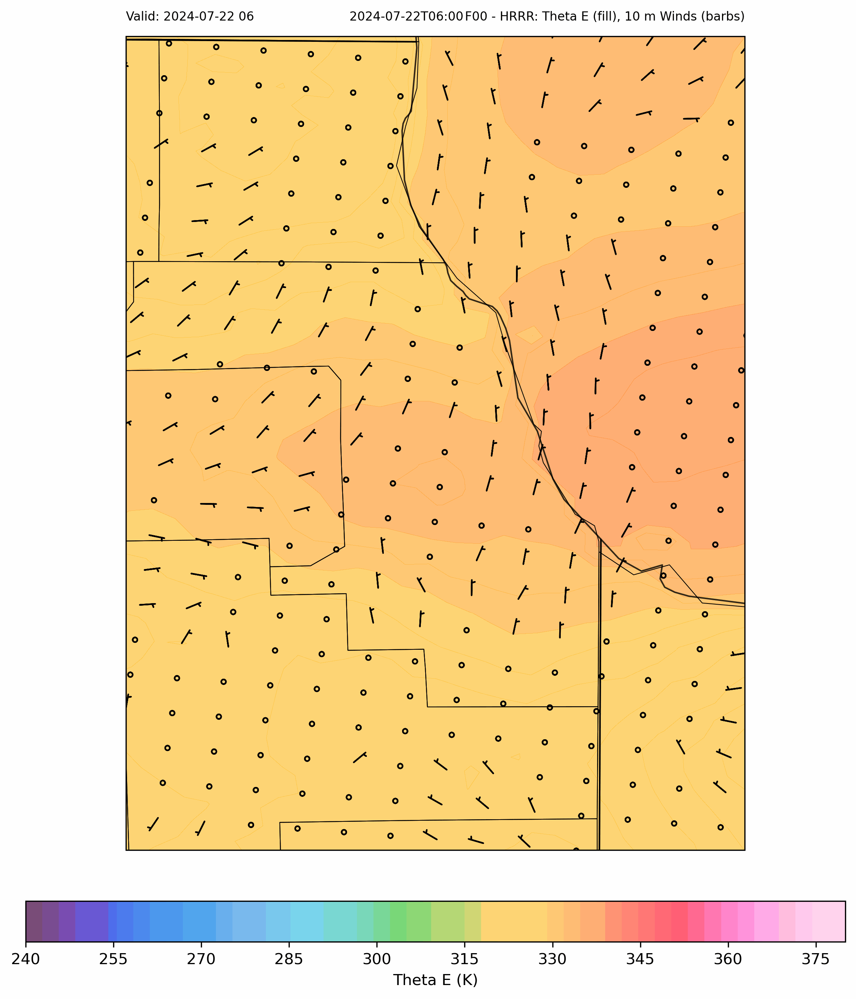

In [13]:
if __name__ == "__main__":
    main()